# CA3 - Lumifruit Edibility Classification
### Jony Karmakar

### Imports

In [ ]:
# Importing Libaries
# ======================
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.impute import SimpleImputer

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

### Reading data

In [2]:
# Loading the dataset 
# ======================
df_train = pd.read_csv('train.csv', index_col=0)
df_test = pd.read_csv('test.csv', index_col=0)

### Data exploration and visualisation

In [3]:
#Cheking for missing data
# =======================
null_counts = df_train.isnull().sum().sum()
print(f'Total Missing values: {null_counts}' )

Total Missing values: 37


In [4]:
# Checking the info
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1248 entries, 0 to 1247
Data columns (total 17 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Acoustic Firmness Index               1245 non-null   float64
 1   Atmospheric Pressure at Harvest (Pa)  1248 non-null   float64
 2   Bitterness Scale                      1244 non-null   float64
 3   Circumference (mm)                    1246 non-null   float64
 4   Color Intensity (a.u.)                1248 non-null   float64
 5   Find Distance from Main Vulcano (km)  1246 non-null   float64
 6   Length (mm)                           1244 non-null   float64
 7   Luminescence Intensity (a.u.)         1247 non-null   float64
 8   Magnetic orientation (degree)         1245 non-null   float64
 9   Odor index (a.u.)                     1246 non-null   float64
 10  Seed Count                            1247 non-null   float64
 11  Skin Thickness (mm)   

In [5]:
df_train.describe()

,Acoustic Firmness Index,Atmospheric Pressure at Harvest (Pa),Bitterness Scale,Circumference (mm),Color Intensity (a.u.),Find Distance from Main Vulcano (km),Length (mm),Luminescence Intensity (a.u.),Magnetic orientation (degree),Odor index (a.u.),Seed Count,Skin Thickness (mm),Soil pH where Grown,Sugar Content (mg),Weight (mg),pH,Edible
count,1245.000000,1248.000000,1244.000000,1246.000000,1248.000000,1246.000000,1244.000000,1247.000000,1245.000000,1246.000000,1247.000000,1247.000000,1245.000000,1245.000000,1244.000000,1244.000000,1248.000000
mean,21.570077,101327.543269,1.808682,211.046062,63.300962,44.188204,33.589646,0.002850,178.933737,16.602442,48.926812,3.839615,7.278739,11835.978313,78446.779224,4.614780,0.494391
std,8.131888,4772.582203,1.960279,24.652278,7.118135,28.331532,3.874355,0.003607,102.113321,14.882420,35.871733,1.483029,0.529815,2417.733775,26637.766132,0.993407,0.500169
min,0.600000,83825.000000,0.000000,145.867667,46.060000,2.550790,23.451799,0.000004,0.085357,1.722825,0.000000,1.000000,5.710000,4566.000000,32352.182600,-5.120000,0.000000
25%,17.300000,98095.750000,0.000000,192.982222,58.577500,21.203453,30.777936,0.000627,90.582930,7.615908,15.852008,3.000000,6.910000,10353.000000,57087.682600,4.174979,0.000000
50%,21.300000,101357.000000,1.000000,212.429730,62.390000,38.880858,33.784401,0.001757,180.043851,12.258785,47.932723,4.000000,7.280000,11807.000000,77440.682600,4.910000,0.000000
75%,25.300000,104470.750000,3.000000,226.313333,67.202500,60.680816,36.049083,0.003767,266.481765,20.302048,80.413165,5.000000,7.660000,13534.000000,92664.102600,5.080000,1.000000
max,156.520701,115636.000000,7.000000,274.719407,97.810000,109.952511,43.691515,0.044624,359.443812,152.041780,112.968004,8.500000,8.980000,18246.000000,164679.342600,6.081918,1.000000


#### Histogram

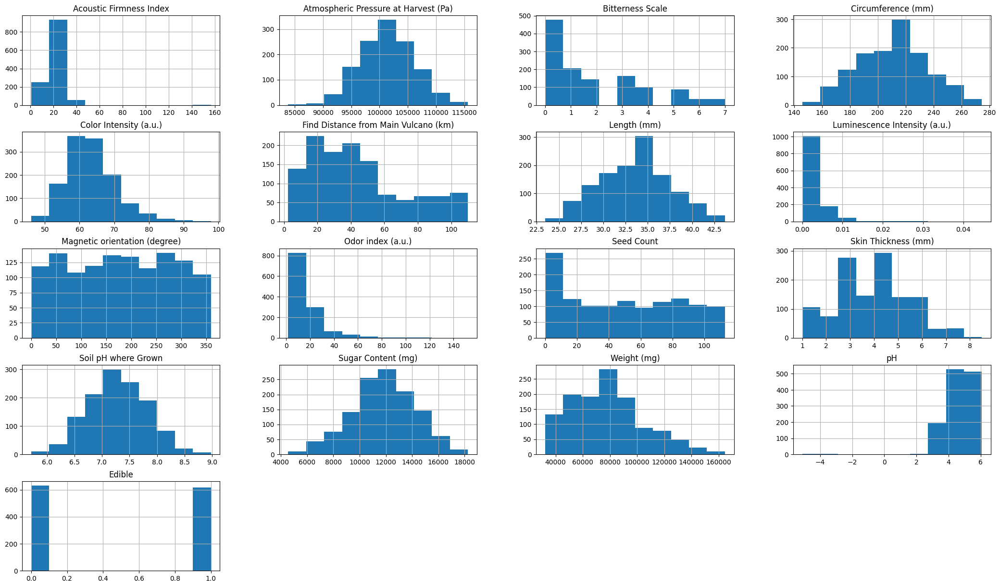

In [6]:
# Plotting histograms for all columns in the dataset
df_train.hist(bins=10, figsize=(26, 15))
plt.show()

#### Box Plots

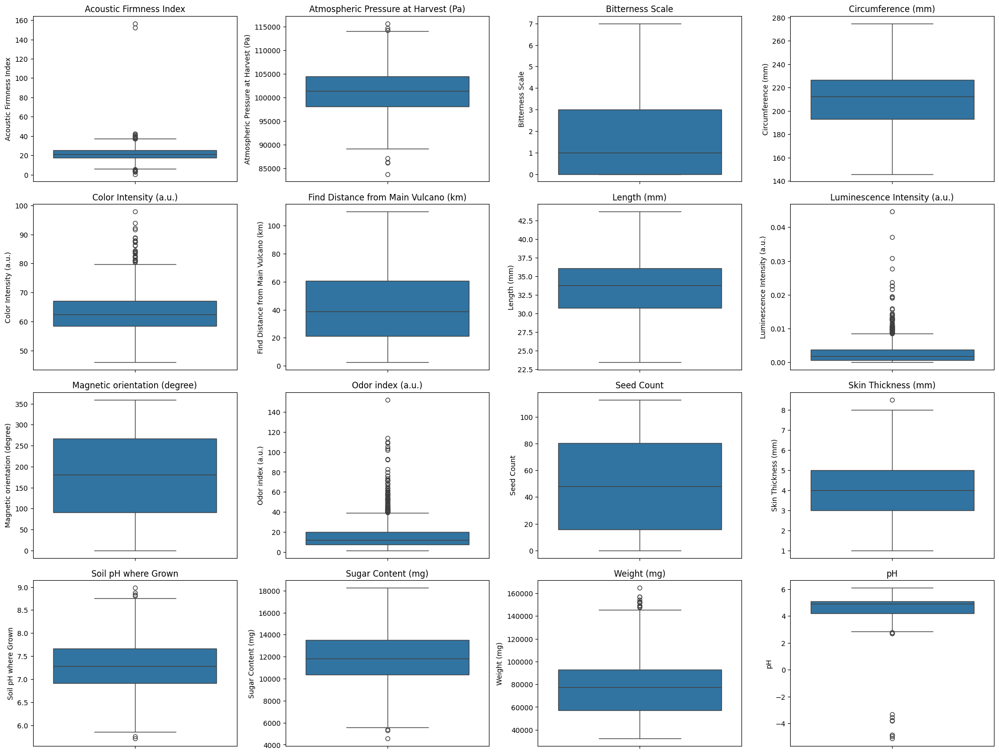

In [7]:
# Removing the target variable
features = df_train.columns[:-1]

plt.figure(figsize=(20, 60))

for i, column in enumerate(features):
    plt.subplot(len(features), 4, i + 1)
    sns.boxplot(y=df_train[column])
    plt.title(column)

plt.tight_layout()
plt.show()

#### Violin Plots

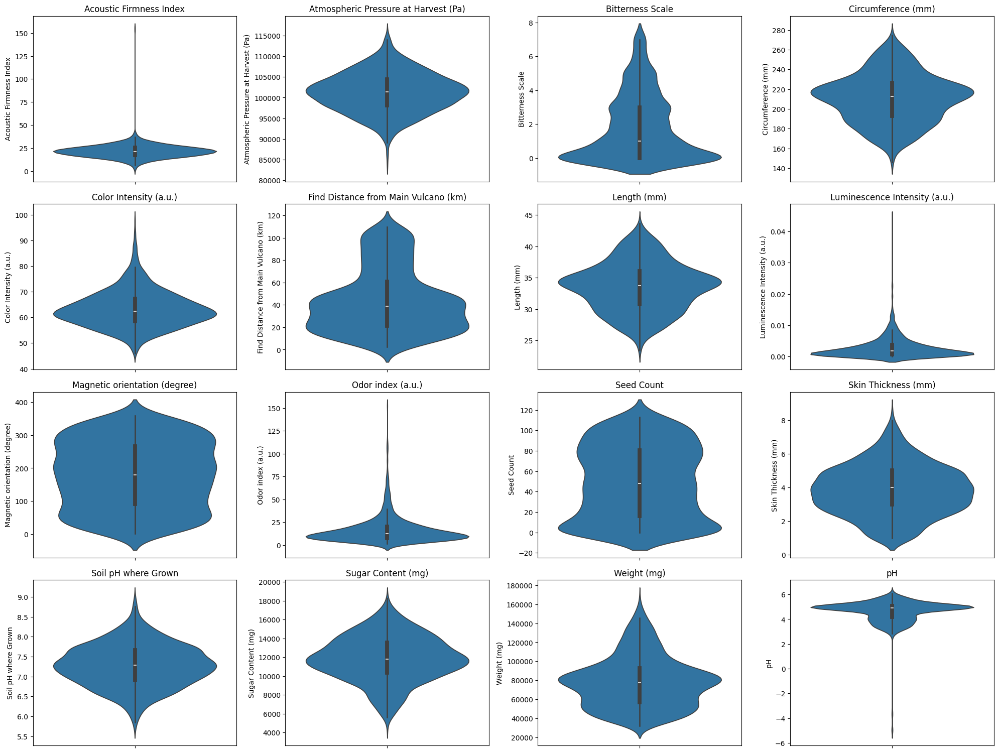

In [92]:
# Removing the target variable
features = df_train.columns[:-1]

plt.figure(figsize=(20, 60))

for i, column in enumerate(features):
    plt.subplot(len(features), 4, i + 1)
    sns.violinplot(y=df_train[column])
    plt.title(column)

plt.tight_layout()
plt.show()

#### Heatmap

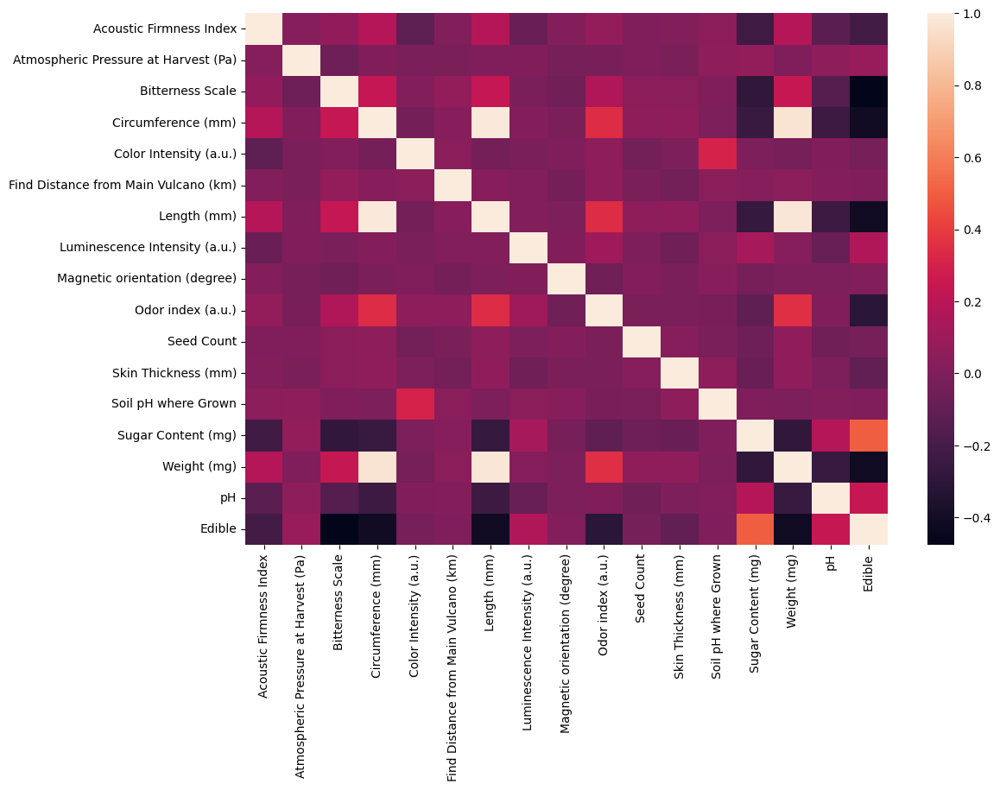

In [8]:
corr_matrix = df_train.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, cbar=True)

plt.show()

#### Scatter Plot

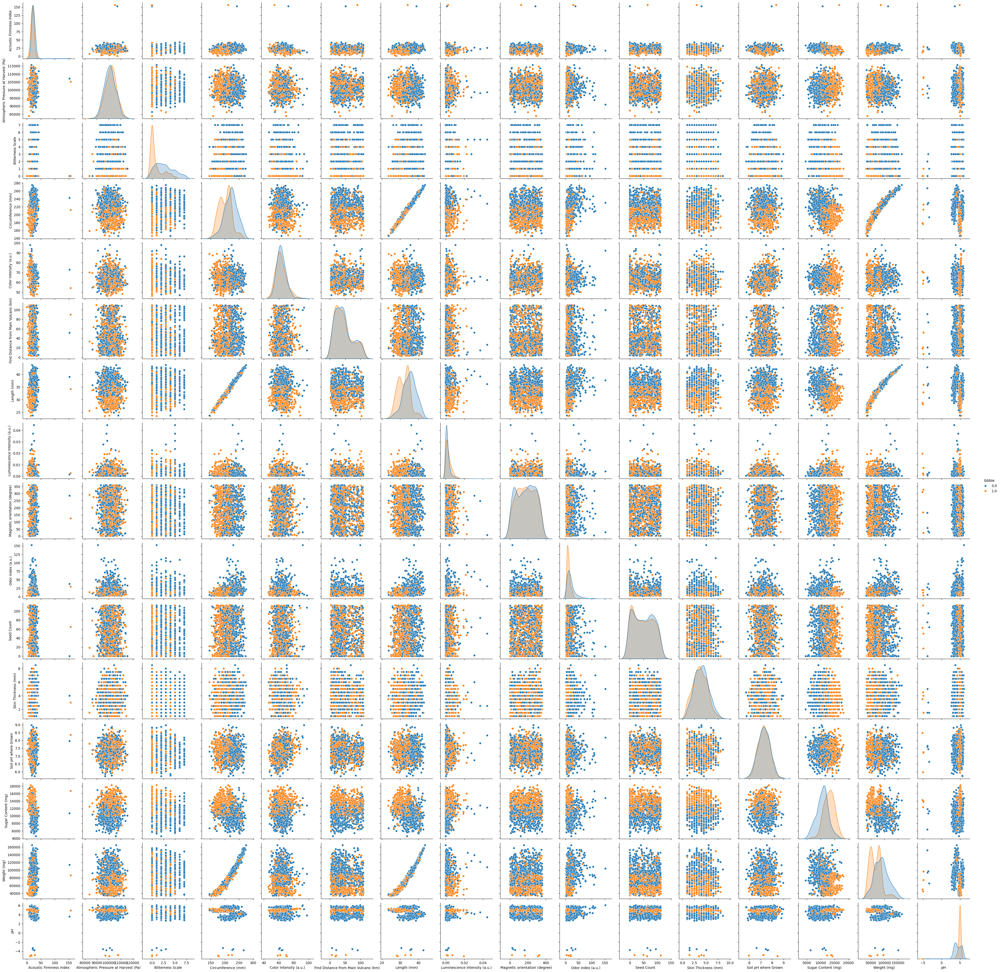

In [10]:
sns.pairplot(df_train, hue="Edible")
plt.show()

### Data cleaning

#### Handling Missing Values

In [10]:
# Impute missing values using the column mean (Taken from Lecture)
imputer = SimpleImputer(missing_values=np.nan, strategy='mean') # other popular choices: "median", "most_frequent"
imputer.fit(df_train.values)
imputed_data = imputer.transform(df_train.values)

# show the dataset
# note that the output of the SimpleImputer is a NumPy array
# so we need to convert it back to a pandas DataFrame to use our helper function
df_train_imp = pd.DataFrame(imputed_data, columns=df_train.columns)
df_train_imp.index = df_train.index


In [11]:
df_train_imp.isnull().sum()

Acoustic Firmness Index                 0
Atmospheric Pressure at Harvest (Pa)    0
Bitterness Scale                        0
Circumference (mm)                      0
Color Intensity (a.u.)                  0
Find Distance from Main Vulcano (km)    0
Length (mm)                             0
Luminescence Intensity (a.u.)           0
Magnetic orientation (degree)           0
Odor index (a.u.)                       0
Seed Count                              0
Skin Thickness (mm)                     0
Soil pH where Grown                     0
Sugar Content (mg)                      0
Weight (mg)                             0
pH                                      0
Edible                                  0
dtype: int64

#### Detecting the Outliers

In [12]:
# Detect the outliers using the z-score
outliers_count = {}

# Iterating through each column in df_train_dna
for column in df_train_imp.columns:
    samples = df_train_imp[column].values
    z_scores = (samples - np.mean(samples)) / np.std(samples)
    outliers = np.abs(z_scores) > 3
    outliers_count[column] = np.sum(outliers)

for feature, count in outliers_count.items():
    print(f"Number of outliers in {feature}: {count}")

Number of outliers in Acoustic Firmness Index: 2
Number of outliers in Atmospheric Pressure at Harvest (Pa): 3
Number of outliers in Bitterness Scale: 0
Number of outliers in Circumference (mm): 0
Number of outliers in Color Intensity (a.u.): 12
Number of outliers in Find Distance from Main Vulcano (km): 0
Number of outliers in Length (mm): 0
Number of outliers in Luminescence Intensity (a.u.): 18
Number of outliers in Magnetic orientation (degree): 0
Number of outliers in Odor index (a.u.): 28
Number of outliers in Seed Count: 0
Number of outliers in Skin Thickness (mm): 1
Number of outliers in Soil pH where Grown: 2
Number of outliers in Sugar Content (mg): 1
Number of outliers in Weight (mg): 1
Number of outliers in pH: 8
Number of outliers in Edible: 0


##### For this assignment outliers have been ignored.

### Data preprocessing and visualisation

#### Splitting the Dataset

In [44]:
#-----------------------------------------
# Spliting the dataset into test and train
#-----------------------------------------
X_imp = df_train_imp.iloc[:, :-1].values
y_imp = df_train_imp.iloc[:, -1].values
X_train_imp, X_test_imp, y_train_imp, y_test_imp = train_test_split(X_imp, y_imp, test_size=0.20, stratify=y_imp, random_state=42)

##### Scaling the Dataset

In [45]:
# =======================================================================================================
# Standardising unsing the StandardScaler (Taken from the lecture also this is the common way of scaling) 
# =======================================================================================================
# Initialise standard scaler and compute mean and stddev from training data
sc = StandardScaler()
sc.fit(X_train_imp)

# Transform (standardise) both X_train_imp and X_test_imp with mean and stddev from
# training data
X_train_imp_sc = sc.transform(X_train_imp)
X_test_imp_sc = sc.transform(X_test_imp)

#### Exploring training data after cleaning and scaling

In [81]:
# Converting numpy array to dataframe
X_train_imp_sc_df = pd.DataFrame(X_train_imp_sc)
X_test_imp_sc_df = pd.DataFrame(X_test_imp_sc)

In [82]:
X_train_imp_sc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998 entries, 0 to 997
Data columns (total 16 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       998 non-null    float64
 1   1       998 non-null    float64
 2   2       998 non-null    float64
 3   3       998 non-null    float64
 4   4       998 non-null    float64
 5   5       998 non-null    float64
 6   6       998 non-null    float64
 7   7       998 non-null    float64
 8   8       998 non-null    float64
 9   9       998 non-null    float64
 10  10      998 non-null    float64
 11  11      998 non-null    float64
 12  12      998 non-null    float64
 13  13      998 non-null    float64
 14  14      998 non-null    float64
 15  15      998 non-null    float64
dtypes: float64(16)
memory usage: 124.9 KB


In [83]:
X_train_imp_sc_df.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
count,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02,9.980000e+02
mean,1.203224e-15,7.591345e-16,-1.690921e-17,-5.385138e-15,7.671441e-16,-3.150453e-16,-2.669875e-16,-9.433558e-17,2.036225e-15,1.459532e-15,9.682747e-16,1.779917e-17,-1.940109e-15,-7.600244e-16,-3.287150e-14,7.977587e-15
std,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00
min,-2.790267e+00,-3.192178e+00,-9.400674e-01,-2.637676e+00,-2.421179e+00,-1.485719e+00,-2.620729e+00,-8.202004e-01,-1.753441e+00,-9.915981e-01,-1.400326e+00,-1.877736e+00,-2.908752e+00,-3.057209e+00,-1.686056e+00,-9.988594e+00
25%,-5.767442e-01,-6.614693e-01,-9.400674e-01,-7.379985e-01,-6.535684e-01,-8.184595e-01,-7.314885e-01,-6.379509e-01,-8.690324e-01,-6.032569e-01,-9.239207e-01,-8.737602e-01,-7.038083e-01,-6.294217e-01,-8.081063e-01,-4.590113e-01
50%,-1.002903e-02,5.589991e-03,-4.263936e-01,5.209417e-02,-1.180030e-01,-1.719907e-01,4.262328e-02,-3.115349e-01,1.105358e-02,-3.013487e-01,-3.176661e-02,1.302153e-01,6.258341e-03,-5.000689e-03,-4.853229e-02,2.962997e-01
75%,5.033483e-01,6.355494e-01,6.009541e-01,6.287116e-01,5.392977e-01,6.343581e-01,6.444112e-01,2.732684e-01,8.434427e-01,2.636343e-01,8.728676e-01,7.995323e-01,7.350109e-01,6.914323e-01,5.476844e-01,4.707939e-01
max,1.800094e+01,2.812833e+00,2.655650e+00,2.558980e+00,4.819973e+00,2.290280e+00,2.591265e+00,1.208737e+01,1.793447e+00,8.919630e+00,1.766415e+00,3.142142e+00,2.996013e+00,2.497759e+00,3.197890e+00,1.509464e+00


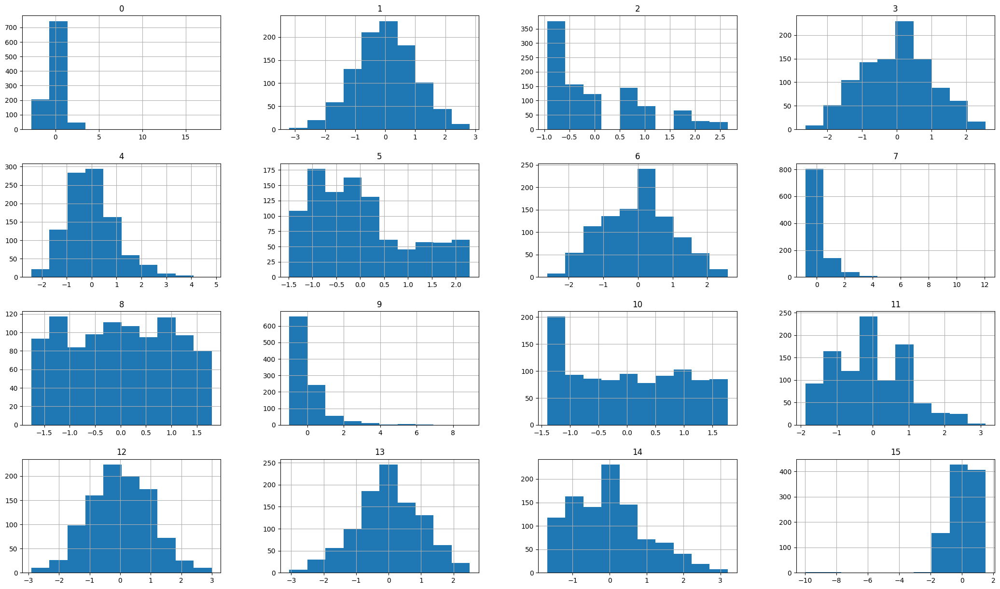

In [84]:
# Plotting histograms for all columns in the dataset
X_train_imp_sc_df.hist(bins=10, figsize=(26, 15))
plt.show()

#### Box Plots

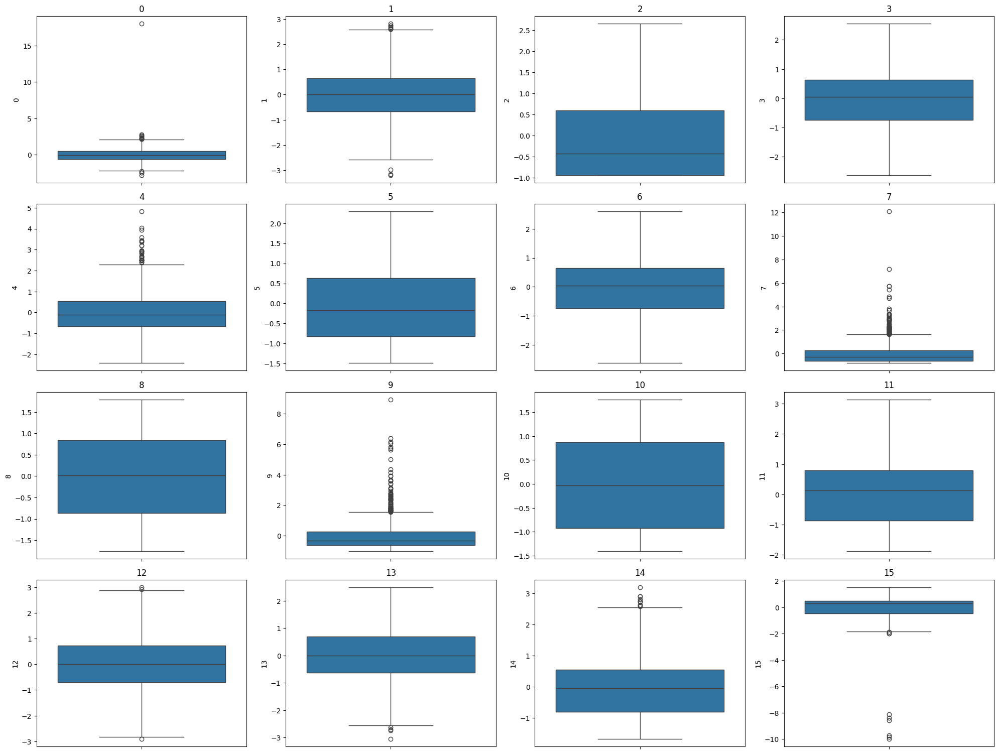

In [90]:
features = X_train_imp_sc_df.columns

plt.figure(figsize=(20, 60))

for i, column in enumerate(features):
    plt.subplot(len(features), 4, i + 1)
    sns.boxplot(y=X_train_imp_sc_df[column])
    plt.title(column)

plt.tight_layout()
plt.show()

#### Violin Plots

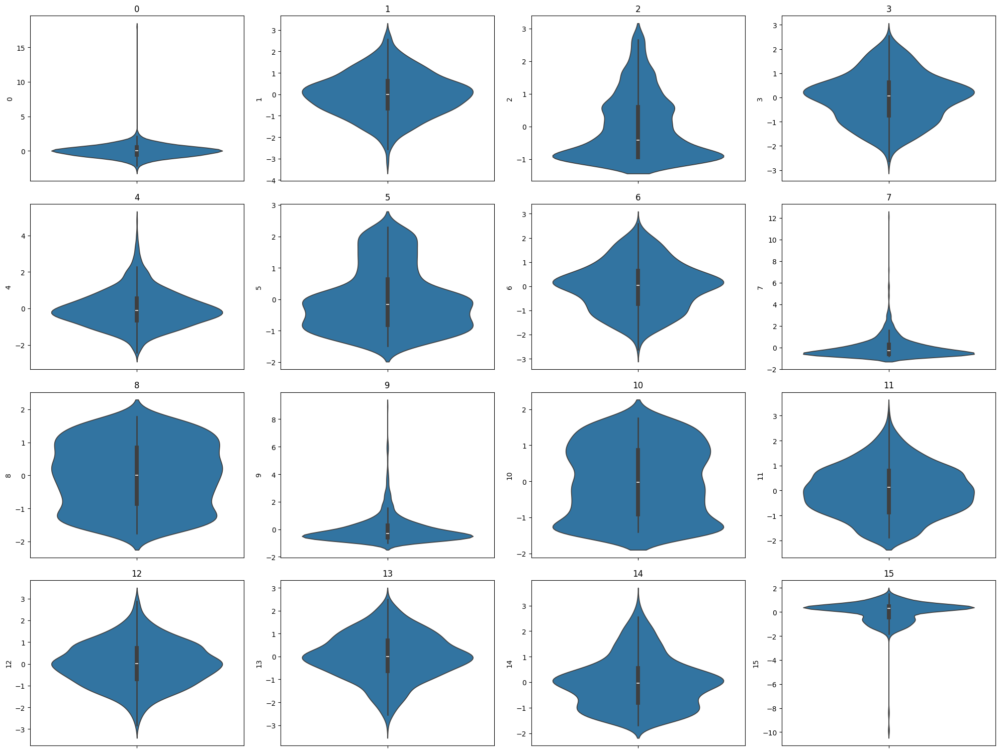

In [91]:
features = X_train_imp_sc_df.columns

plt.figure(figsize=(20, 60))

for i, column in enumerate(features):
    plt.subplot(len(features), 4, i + 1)
    sns.violinplot(y=X_train_imp_sc_df[column])
    plt.title(column)

plt.tight_layout()
plt.show()

### Modelling

##### Random Forest

In [52]:
#------------------------------------------------------------------------------------
# RANDOM FOREST()
# Parameters tuned for this model
# 'n_estimators' : Number of Trees(High->Robustness but time consuming)
# 'max_depth' : Max depth of Trees(High->Accurate model but overfitting)
# 'max_features' : The number of features to consider when looking for the best split
#------------------------------------------------------------------------------------

# Parameters to test
param_grid = {'n_estimators': [50, 100, 200], 'max_depth': [None, 5, 10, 25], 'max_features': [*np.arange(0.1, 1.1, 0.1)]}

# Store the best parameter combination and its accuracy
best_params_rf = None
best_accuracy_rf = 0

for n_estimators in param_grid['n_estimators']:
    for max_depth in param_grid['max_depth']:
        for max_feature in param_grid['max_features']:
            accuracies = []
            for random_state in range(40, 50):
                # Splitting Dataset
                X_train, X_val, y_train, y_val = train_test_split(X_train_imp, y_train_imp, test_size=0.25, random_state=random_state)
                # Standardize the data
                scaler = StandardScaler()
                X_train_scaled = scaler.fit_transform(X_train)
                X_val_scaled = scaler.transform(X_val)

                #  Defining the model
                rfc = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth, max_features=max_feature, random_state=42)
                # Fitting the model
                rfc.fit(X_train_scaled, y_train)
                # Evaluating on the test dataset
                y_pred = rfc.predict(X_val_scaled)
                accuracy = accuracy_score(y_val, y_pred)
                accuracies.append(accuracy)
            
            # Measuring the average accuracy for different splits of dataset
            accuracy = np.mean(accuracies)
        
        if accuracy > best_accuracy_rf:
            best_accuracy_rf = accuracy
            best_params_rf= {'n_estimators': n_estimators, 'max_depth': max_depth, 'max_features': max_feature}

print("Best Parameters:", best_params_rf)
print("Best Accuracy:", best_accuracy_rf)

Best Parameters: {'n_estimators': 100, 'max_depth': 10, 'max_features': 1.0}
Best Accuracy: 0.8976000000000001


##### Testing for X_train and X_test of Train_df

In [57]:
rfc = RandomForestClassifier(n_estimators=best_params_rf['n_estimators'], max_depth=best_params_rf['max_depth'], max_features=best_params_rf['max_features'], random_state=42)
rfc.fit(X_train_imp_sc, y_train_imp)

y_pred_rfc = rfc.predict(X_test_imp_sc)
accuracy_rfc = accuracy_score(y_pred_rfc, y_test_imp)
print(f'For Random Forest with Best Parameters: {best_params_rf} and Accuracy: {accuracy_rfc}')

For Random Forest with Best Parameters: {'n_estimators': 100, 'max_depth': 10, 'max_features': 1.0} and Accuracy: 0.904


##### Random Forest
For Random Forest we can see it has the best accuracy

### Final evaluation

In [ ]:
#------------------------------------------------
# Train the best model on the entire training set
#------------------------------------------------
scaler = StandardScaler()
scaler.fit(X_imp)
X_train_scaled = scaler.transform(X_imp)
rfc.fit(X_train_scaled, y_imp)

#-------------------------------------------------------
# Use the test set to evaluate the best k on unseen data
#-------------------------------------------------------
X_test_scaled = scaler.transform(df_test)
y_pred_rf = rfc.predict(X_test_scaled)

### Kaggle submission

In [69]:
#----------------------------------------
# Creating csv file for Kaggle submission
#----------------------------------------
DF = pd.DataFrame(y_pred_rf)
headers = ["Edible"]
DF.columns = headers
DF.to_csv('predictions.csv', index_label='index', index=True)